In [4]:
import os
from pathlib import Path
import numpy as np
import cv2
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

from dataset import MaskRCNNDataset
import utils

In [5]:
DATA_PATH = '../data/training/maskrcnn'

all_bags = os.listdir(DATA_PATH)
train_bags = [os.path.join(DATA_PATH, x) for x in all_bags]

dataset = MaskRCNNDataset(train_bags)
loader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=0, collate_fn=utils.collate_fn)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


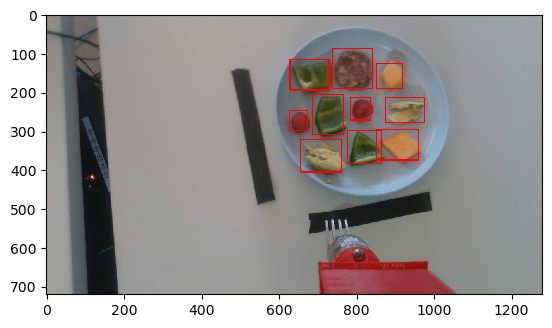

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


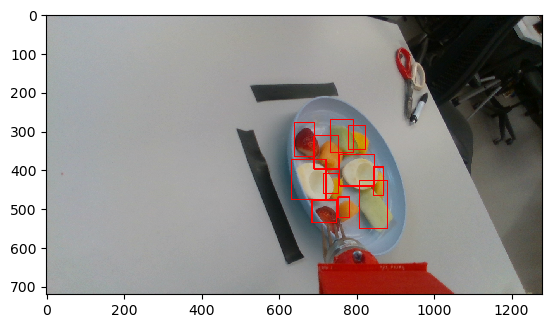

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


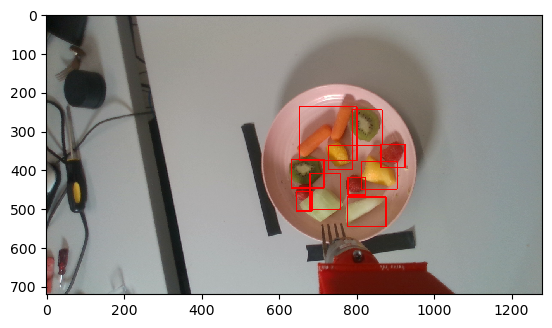

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


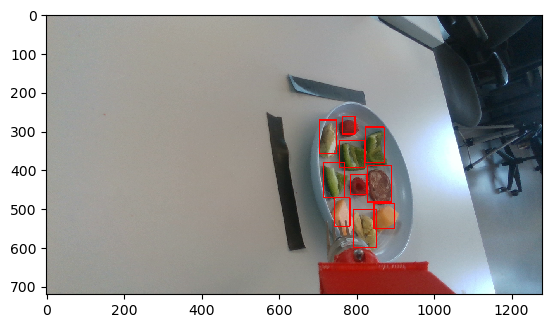

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


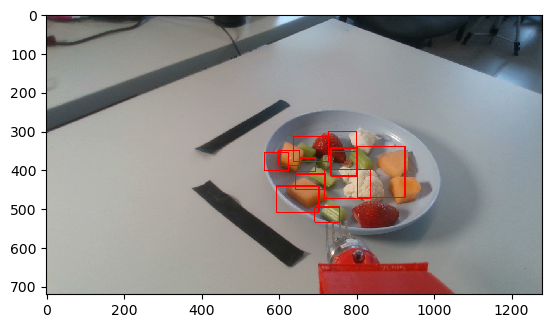

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


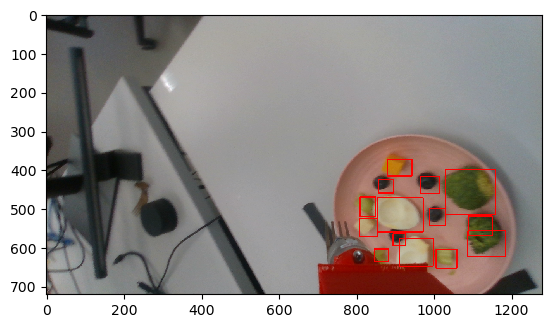

In [4]:
import cv2

for i, batch in enumerate(loader):
    if i > 5:
        break

    image, targets = batch
    draw_img = image[0].permute(1,2,0).detach().numpy().copy()
    plt.imshow(image[0].permute(1,2,0))
    # plt.show()

    # canvas = np.zeros((720,1280))
    # for mask in targets[0]['masks']:
    #     canvas = np.logical_or(canvas, mask) 
    
    # plt.imshow(canvas, cmap='gray')
    # plt.show()
    boxes = targets[0]['boxes']
    for box in boxes:
        x1,y1,x2,y2 = box.detach().numpy().astype('int')
        cv2.rectangle(draw_img, (x1,y1),(x2,y2), thickness=2, color=[255,0,0])
    
    plt.imshow(draw_img)
    plt.show()

../data/training/maskrcnn/bag_21/callback_50.npz


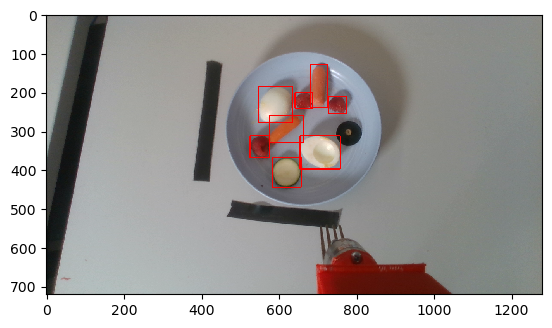

../data/training/maskrcnn/bag_21/callback_100.npz


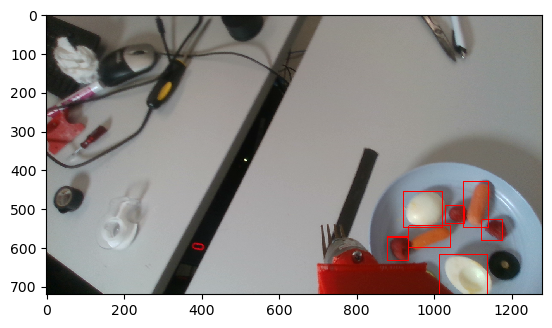

../data/training/maskrcnn/bag_21/callback_400.npz


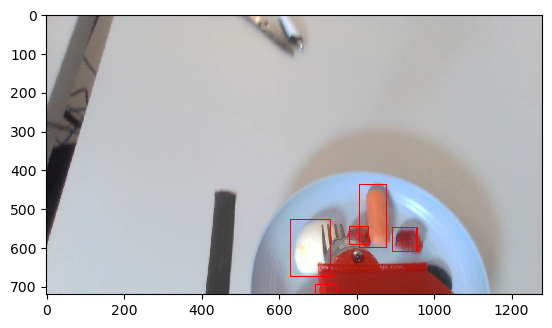

../data/training/maskrcnn/bag_21/callback_450.npz


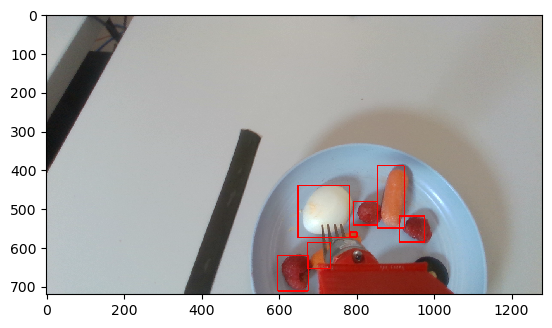

../data/training/maskrcnn/bag_21/callback_500.npz


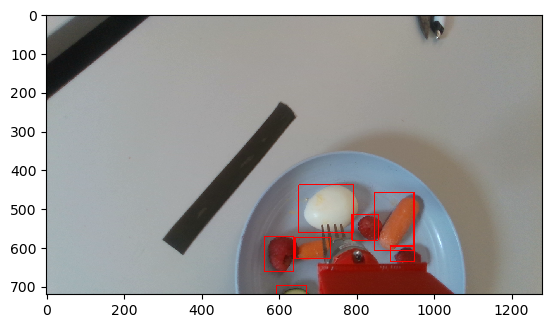

../data/training/maskrcnn/bag_21/callback_550.npz


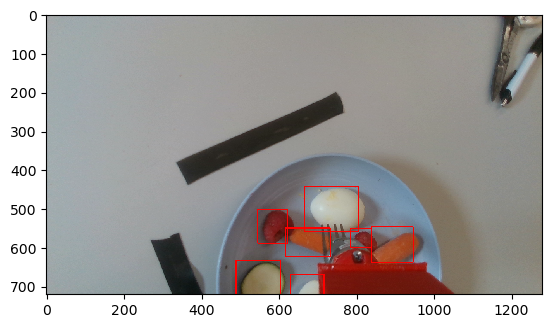

../data/training/maskrcnn/bag_21/callback_600.npz


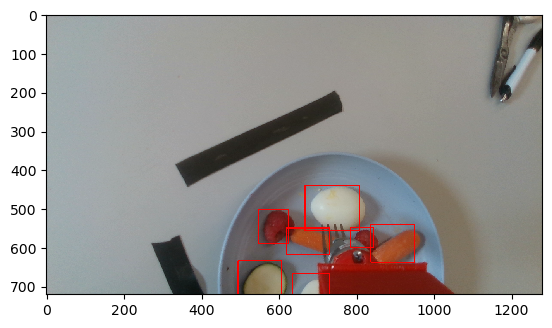

../data/training/maskrcnn/bag_21/callback_650.npz


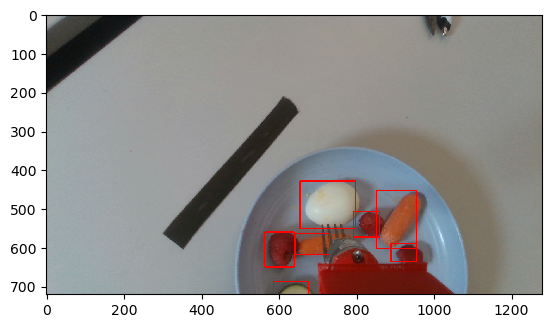

../data/training/maskrcnn/bag_21/callback_700.npz


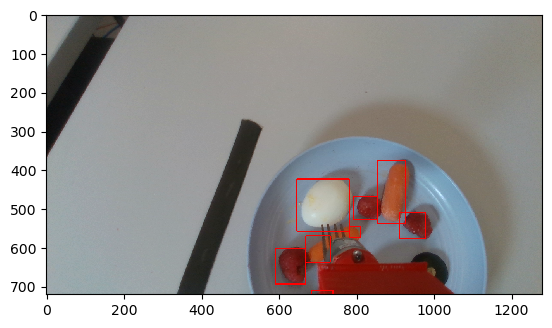

../data/training/maskrcnn/bag_21/callback_750.npz


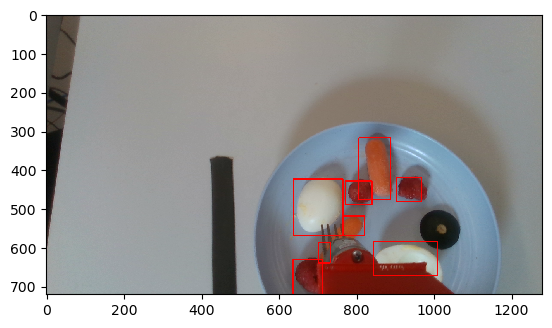

../data/training/maskrcnn/bag_21/callback_800.npz


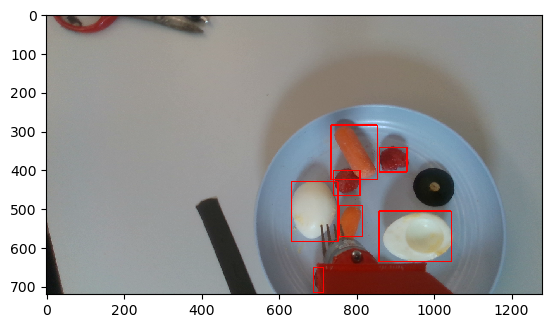

../data/training/maskrcnn/bag_21/callback_850.npz


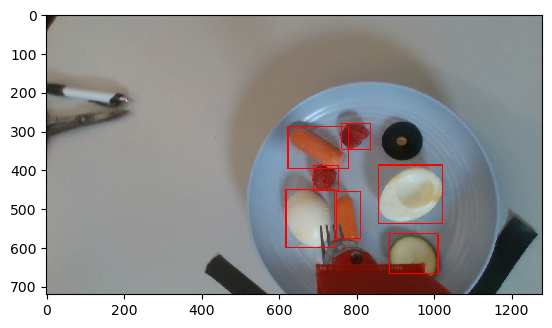

../data/training/maskrcnn/bag_21/callback_900.npz


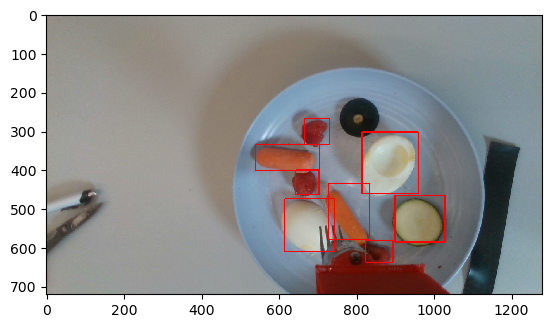

../data/training/maskrcnn/bag_21/callback_950.npz


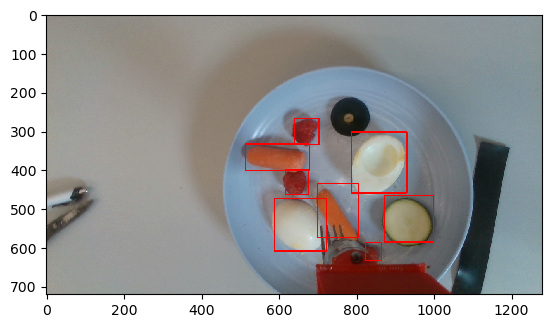

../data/training/maskrcnn/bag_21/callback_1000.npz


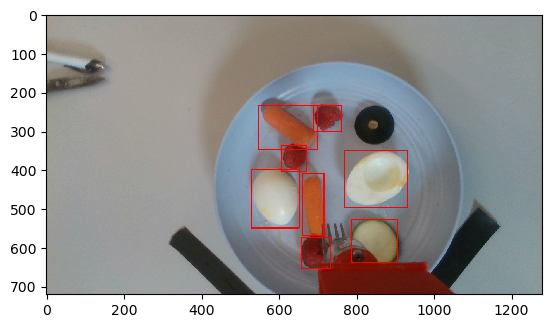

../data/training/maskrcnn/bag_21/callback_1050.npz


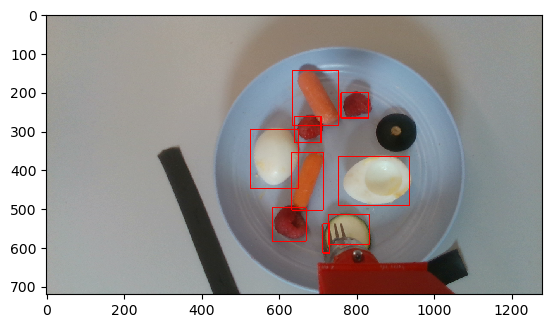

../data/training/maskrcnn/bag_21/callback_1100.npz


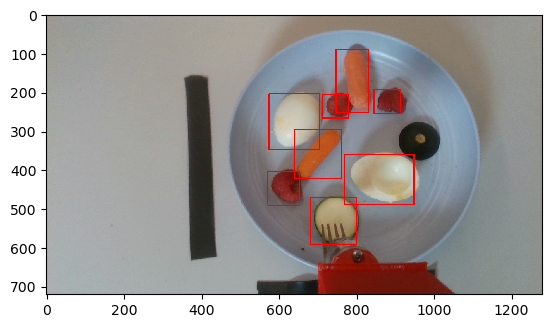

../data/training/maskrcnn/bag_21/callback_1150.npz


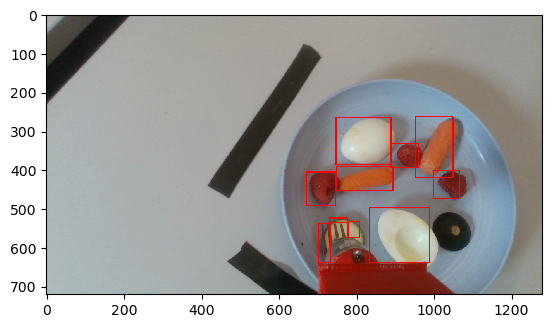

../data/training/maskrcnn/bag_21/callback_1200.npz


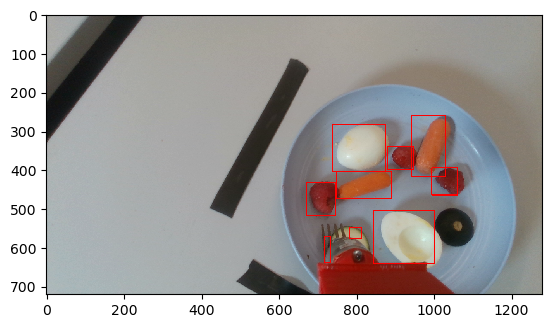

../data/training/maskrcnn/bag_21/callback_1250.npz


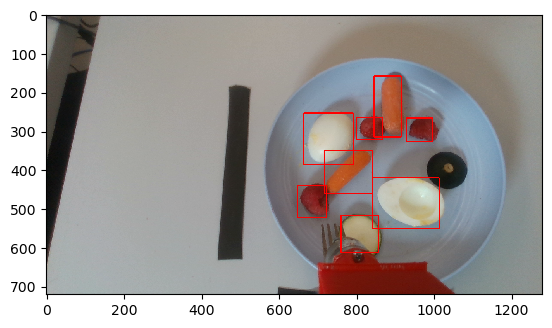

../data/training/maskrcnn/bag_21/callback_1300.npz


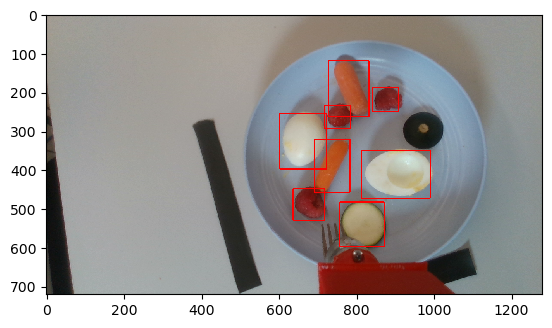

../data/training/maskrcnn/bag_21/callback_1350.npz


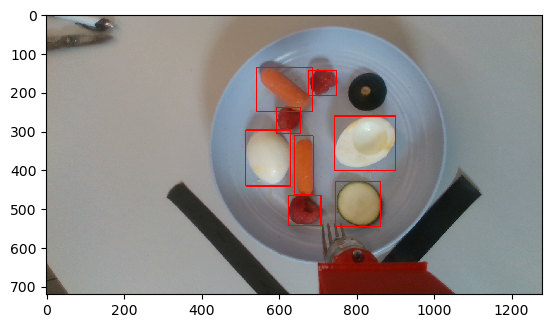

../data/training/maskrcnn/bag_21/callback_1700.npz


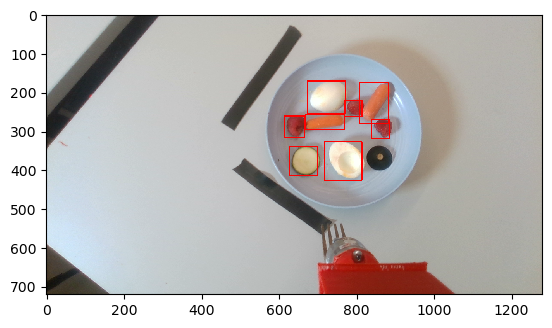

../data/training/maskrcnn/bag_21/callback_1750.npz


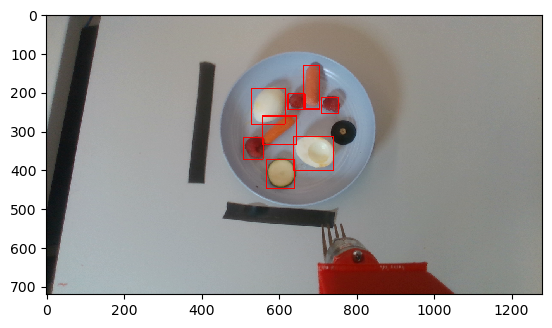

../data/training/maskrcnn/bag_21/callback_1800.npz


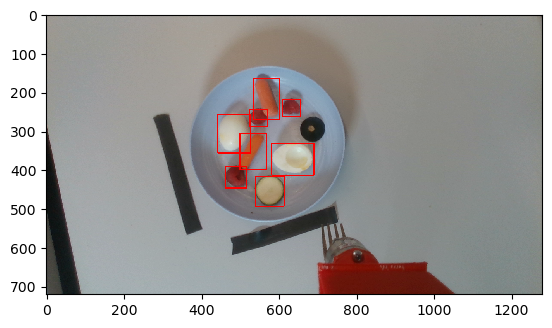

../data/training/maskrcnn/bag_21/callback_1850.npz


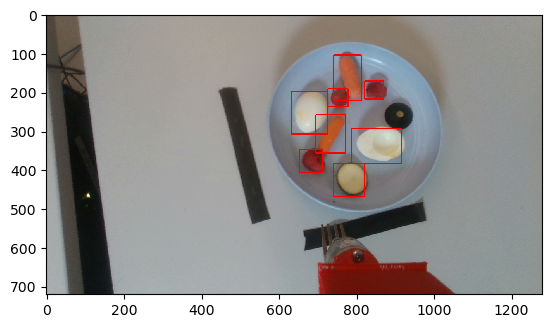

../data/training/maskrcnn/bag_21/callback_1900.npz


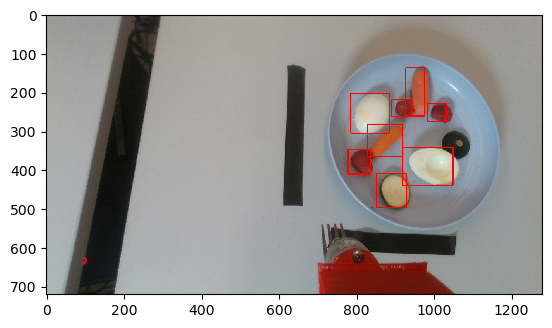

../data/training/maskrcnn/bag_21/callback_1950.npz


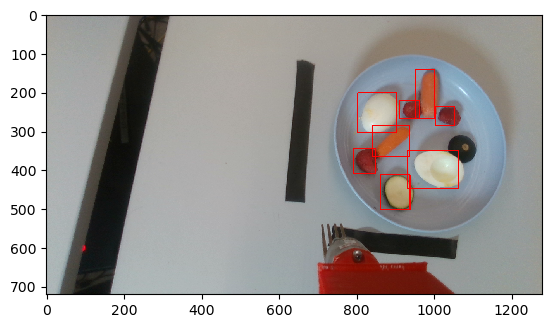

../data/training/maskrcnn/bag_21/callback_2000.npz


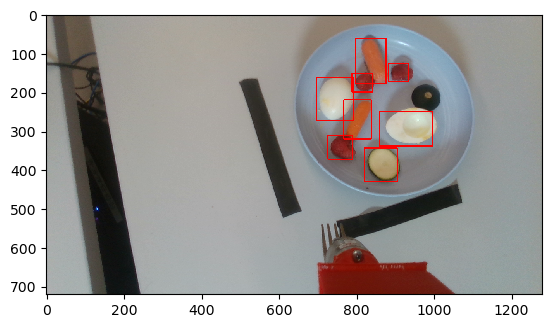

../data/training/maskrcnn/bag_21/callback_2050.npz


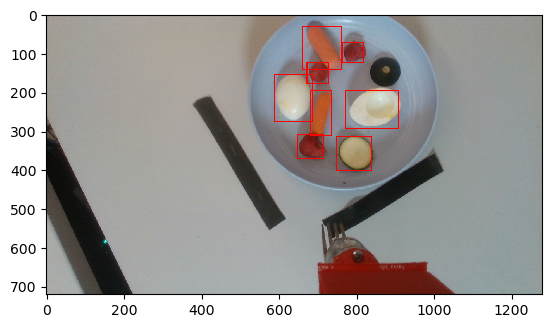

../data/training/maskrcnn/bag_21/callback_2100.npz


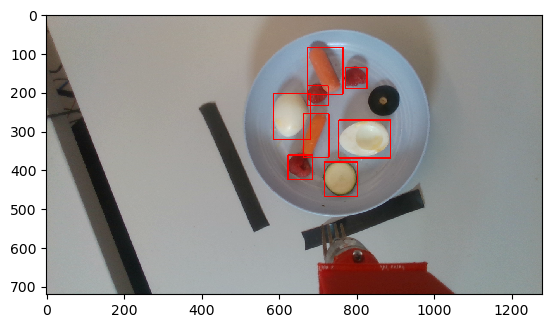

../data/training/maskrcnn/bag_21/callback_2150.npz


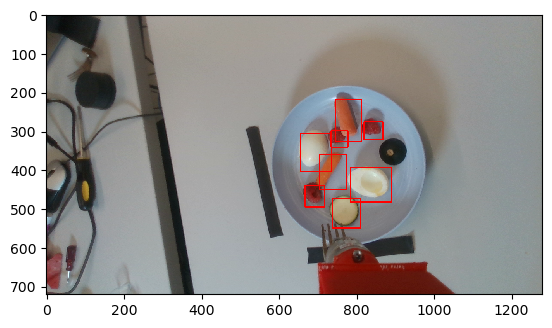

../data/training/maskrcnn/bag_21/callback_2200.npz


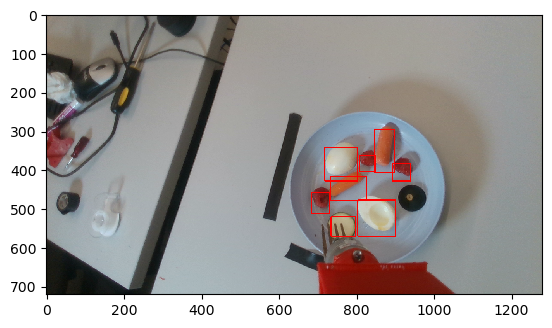

../data/training/maskrcnn/bag_21/callback_2250.npz


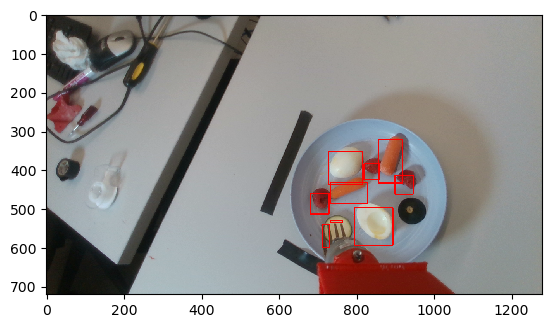

../data/training/maskrcnn/bag_21/callback_2300.npz


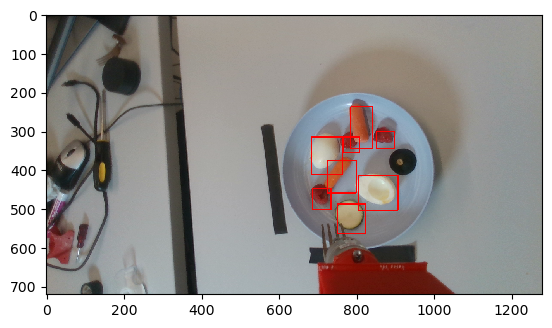

../data/training/maskrcnn/bag_21/callback_2350.npz


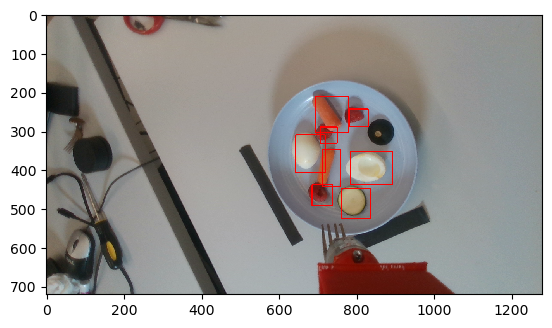

../data/training/maskrcnn/bag_21/callback_2400.npz


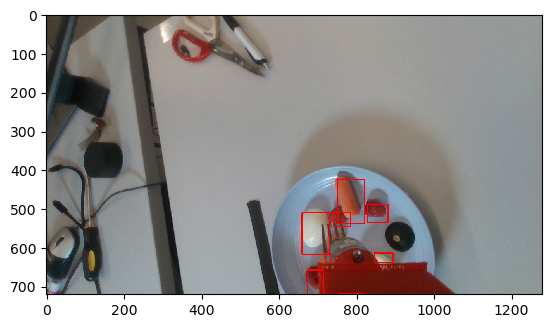

../data/training/maskrcnn/bag_21/callback_2450.npz


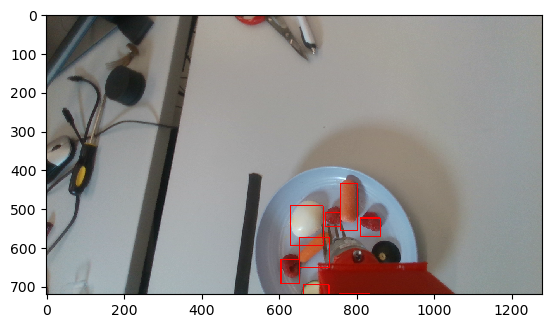

../data/training/maskrcnn/bag_21/callback_2500.npz


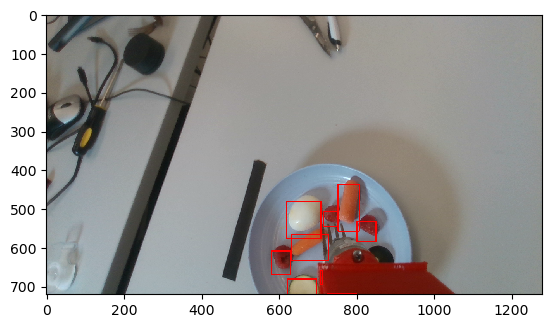

../data/training/maskrcnn/bag_21/callback_2550.npz


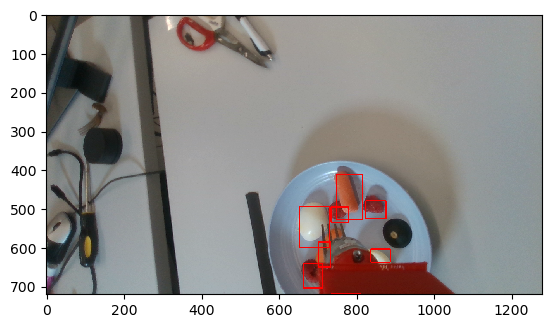

../data/training/maskrcnn/bag_21/callback_2600.npz


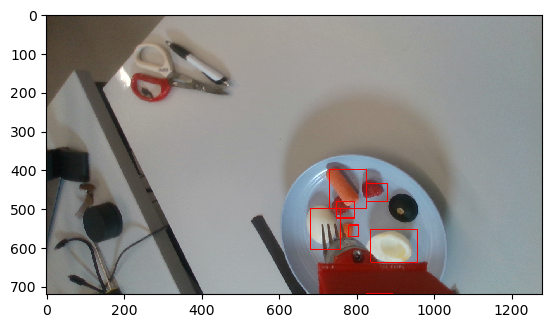

../data/training/maskrcnn/bag_21/callback_2650.npz


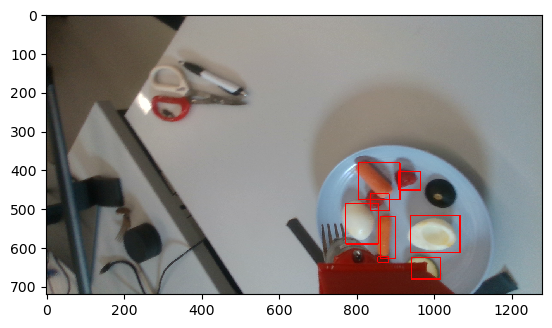

../data/training/maskrcnn/bag_21/callback_3000.npz


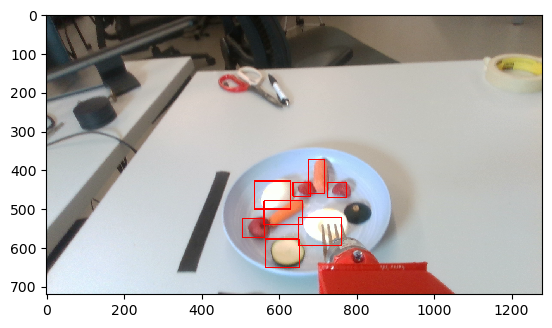

In [7]:
sample_bag_path = '../data/training/maskrcnn/bag_21'
d = os.listdir(sample_bag_path)
N = len(d)

for i in range(N):
    npz_path = os.path.join(sample_bag_path, 'callback_{}.npz'.format(i))

    if i % 50 == 0 and os.path.exists(npz_path):
        print(npz_path)
        npz = np.load(npz_path)
        draw_image = npz['image'].copy()
        boxes = npz['boxes']

        for box in boxes:
            x1,y1,x2,y2 = box.astype('int')
            cv2.rectangle(draw_image, (x1,y1),(x2,y2), thickness=2, color=[255,0,0])

        plt.imshow(draw_image)
        plt.show()
            